In [1]:
import utils
import loss
import batchgen
import models
import numpy as np
from tensorflow import keras
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.patheffects as PathEffects
from sklearn.manifold import TSNE
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import random
from tqdm import tqdm

In [4]:
INPUT_SHAPE = (200, 150, 3)

In [3]:
model = keras.models.load_model("deploy/pretrn_imagenet_mobilv1_classif/model.4.41005.hdf5")

In [10]:
# Plot exmaple images
def plot(X, Y, index, cat = None):        
    if cat:
        assert cat in index.values(), "Category %s should be in provided index"%cat
    fig, axes = plt.subplots(4, 4, figsize = (17, 15))
    axes= axes.flatten()
    i = 0
    ai = 0
    while ai < len(axes):
        if cat:
            if not index[Y[i]] == cat:
                i += 1
                continue
        axes[ai].imshow(X[i])
        axes[ai].set_title("%s"%index[int(Y[i])])
        # print(index[Y[i]])
        ai += 1
        i += 1
    plt.show()

 10%|▉         | 9987/99991 [00:30<02:45, 542.99it/s]

In [6]:
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           [(None, 200, 150, 3)]     0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 201, 151, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 100, 75, 32)       864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 100, 75, 32)       128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 100, 75, 32)       0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 100, 75, 32)       288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 100, 75, 32)       128 

In [8]:
# Load data
X, Y, index = utils.load_data("data/labels/lcwaikiki100k_labels.csv",
                              resize = (INPUT_SHAPE[1], INPUT_SHAPE[0]), 
                              limit = 10000,
                              images_as_path = False)

 10%|▉         | 9987/99991 [00:18<02:45, 542.99it/s]

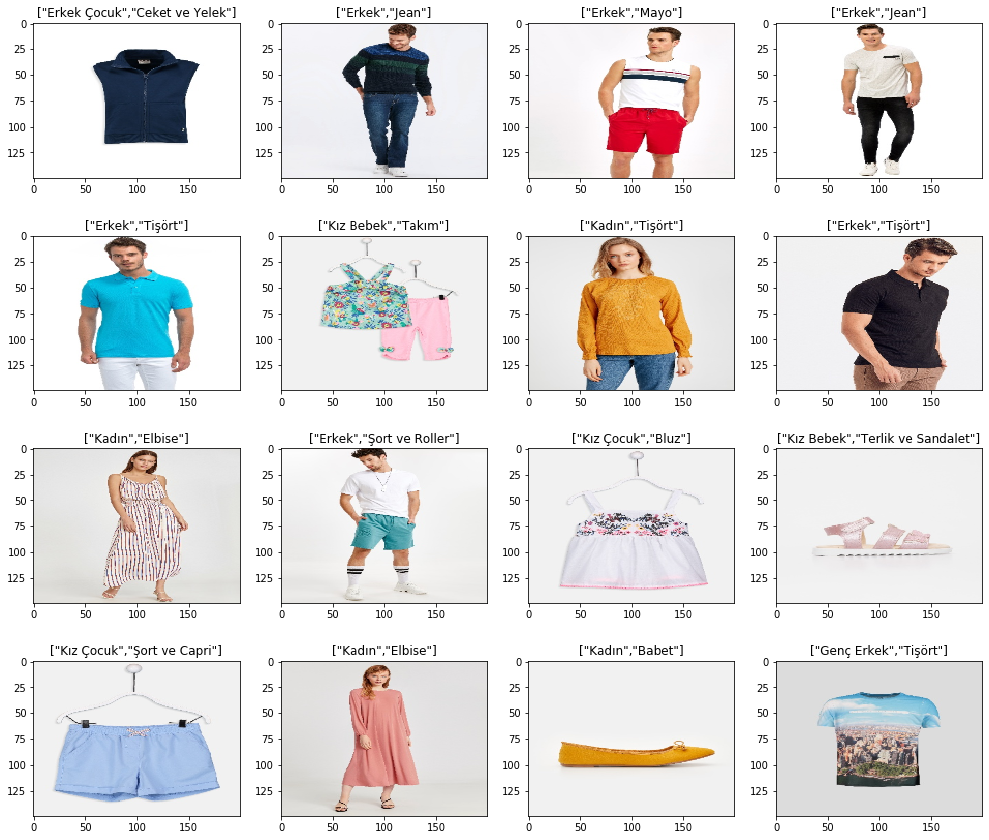

In [11]:
plot(X, Y, index)

In [ ]:
# Compute TSNE embeddings
tsne = TSNE()
X_trm = model.predict(X.reshape(-1,*INPUT_SHAPE), verbose = 1)
tsne_embeds = tsne.fit_transform(X_trm)

10002/10002 [==============================] - 11s 1ms/sample


In [ ]:
def visualize_scatter(data_2d, label_ids, label_index, figsize=(20,20), nb_classes = 10):
    plt.figure(figsize=figsize)
    plt.grid()
    
    classes, counts = np.unique(label_ids, return_counts = True)
    idx = np.argsort(counts)[::-1][:nb_classes]
    classes = classes[idx]
    counts = counts[idx]
    for i, label_id in enumerate(classes):
        plt.scatter(data_2d[np.where(label_ids == label_id), 0],
                    data_2d[np.where(label_ids == label_id), 1],
                    marker='o',
                    color= plt.cm.Set1(i),
                    linewidth='1',
                    alpha=0.8,
                    label=label_index[label_id])
    plt.legend(loc='best')

In [ ]:
def visualize_scatter_with_images(X_2d_data, images, figsize=(100,100), image_zoom=1/2):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    plt.show()
    plt.savefig("./tsne.png")

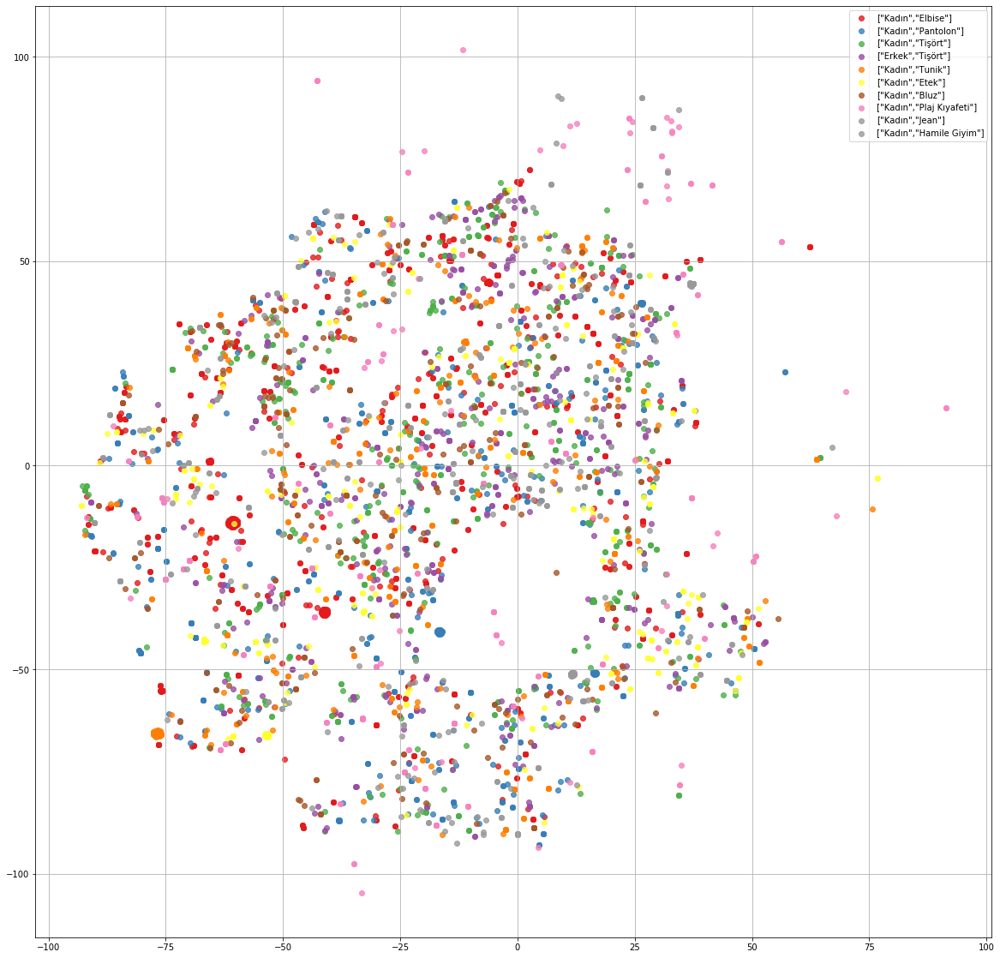

In [10]:
visualize_scatter(tsne_embeds, Y, index, nb_classes = 10)

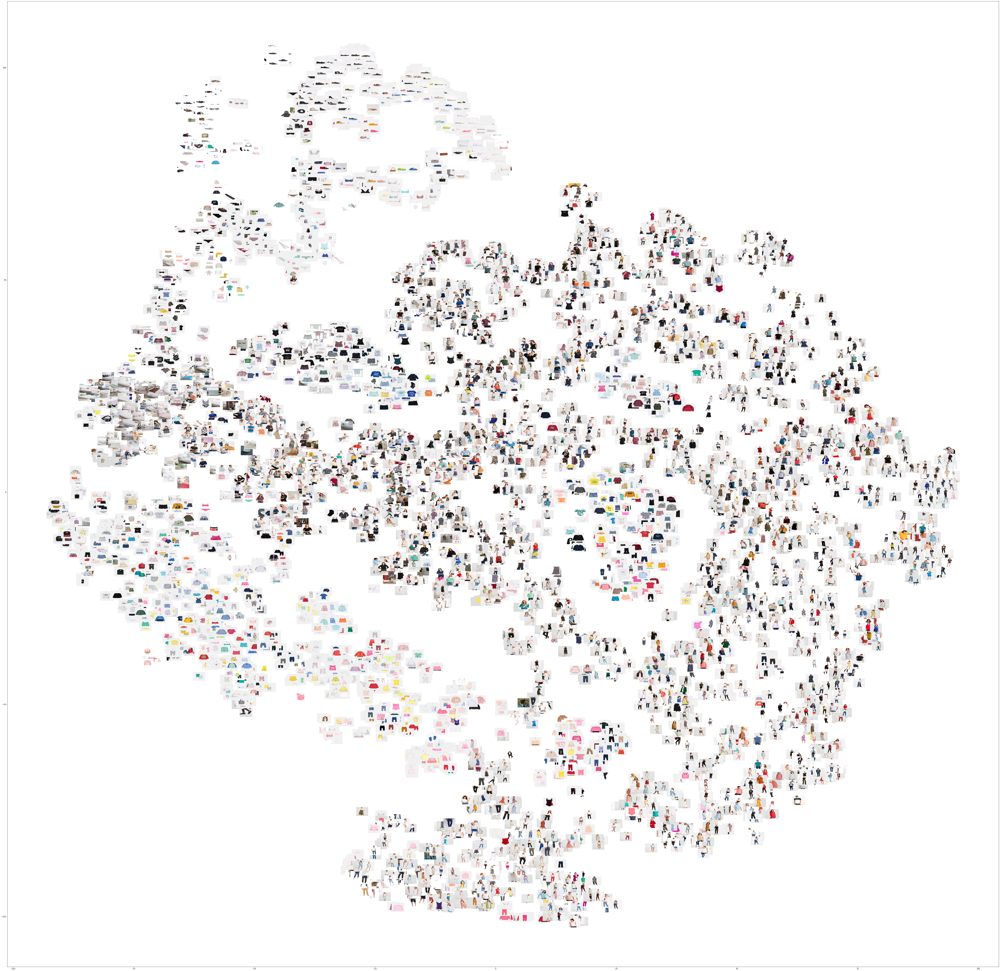

<Figure size 432x288 with 0 Axes>

In [11]:
visualize_scatter_with_images(tsne_embeds, X)

In [11]:
# Get k nearest neighbors given an image
features = model.predict(X.reshape(-1,*INPUT_SHAPE), verbose = 1)

10002/10002 [==============================] - 3s 347us/sample


In [15]:
cos = lambda vA, vB : np.dot(vA, vB) / (np.sqrt(np.dot(vA,vA)) * np.sqrt(np.dot(vB,vB)))
def find_closest_neighbors(model, anchor_images, anchor_features, query_image, k = 16):
    query_feature = np.squeeze(model.predict(query_image.reshape(-1,*INPUT_SHAPE)))
    distances = [cos(ff, query_feature) for ff in anchor_features]
    distances_idx = np.argsort(distances)[::-1]
    closest_images = anchor_images[distances_idx[:k]]
    return closest_images
    


In [31]:
test_idx = random.sample(list(range(len(X))), 1)[0]
test = X[test_idx]
closest_images = find_closest_neighbors(model, X, features, test, k = 16)

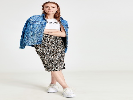

In [32]:
Image.fromarray(test)

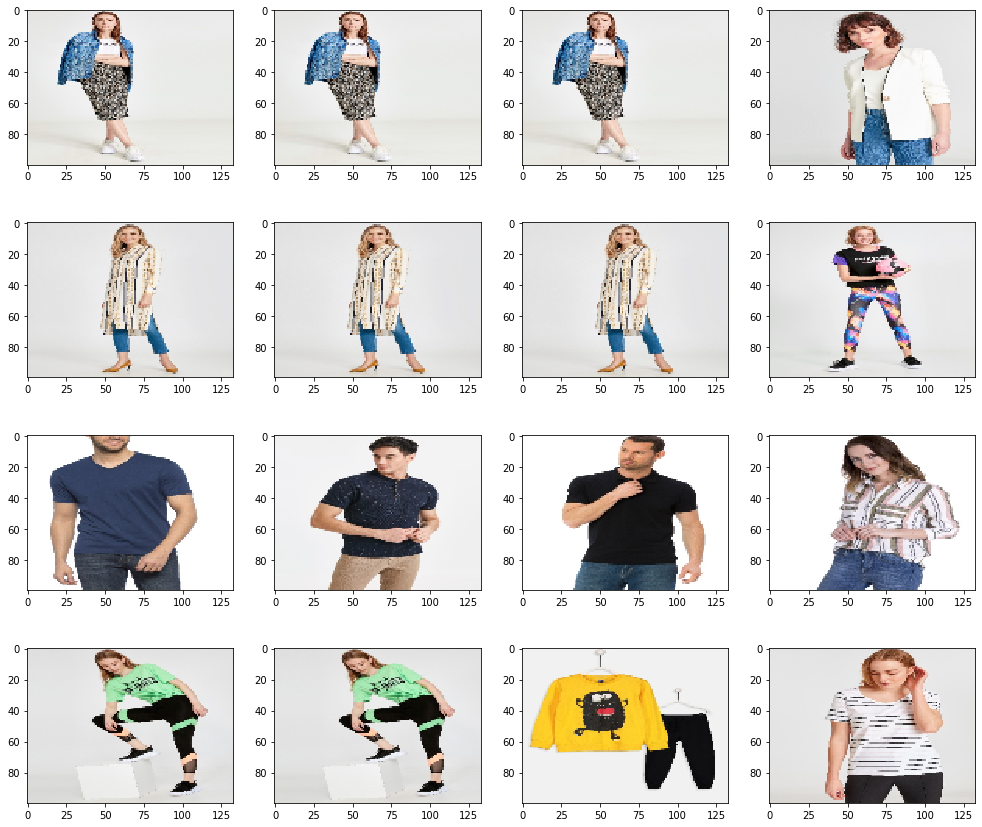

In [33]:
fig, axes = plt.subplots(4, 4, figsize = (17, 15))
axes= axes.flatten()
for i, ax in enumerate(axes):
    ax.imshow(closest_images[i])
plt.show()

In [ ]:
ImageGenerator()